In [1]:
from sklearn.cluster import DBSCAN, KMeans
from sklearn.ensemble import IsolationForest
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import cv2
from collections import Counter
import os
from sklearn.manifold import TSNE
from sklearn.preprocessing import normalize
from sklearn.metrics.pairwise import cosine_distances, cosine_similarity, euclidean_distances

%matplotlib inline

In [2]:
def get_image(image_path):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

In [4]:
def get_images(dir_path):
    images = np.array([get_image(os.path.join(dir_path, img_name)) for img_name in os.listdir(dir_path)])
    return images

In [5]:
def get_colors(image, color_count):
    
    color_sensitivity = 255 / color_count ** (1. / 3.)
    modified_image = image - image % int(color_sensitivity)
    
    modified_image = modified_image.reshape(modified_image.shape[0]*modified_image.shape[1], 3)
    return Counter(list(map(tuple, modified_image)))

In [6]:
def get_data(dir_path, color_count):
    images = get_images(dir_path)
    
    data = pd.DataFrame()
    for image in images:
        data = data.append(get_colors(image, color_count), ignore_index=True).fillna(0)
    return normalize(data), images

In [10]:
data, images = get_data('train', 150)
labels = KMeans(n_clusters=57).fit_predict(data)
# labels = DBSCAN().fit_predict(data)

C:\Users\vorot\AppData\Local\Temp/ipykernel_10848/3974072361.py:2: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  images = np.array([get_image(os.path.join(dir_path, img_name)) for img_name in os.listdir(dir_path)])


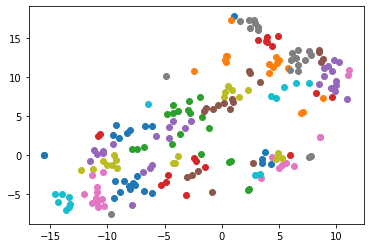

In [11]:
c2d = TSNE().fit_transform(data)
for label in set(labels):
    plt.scatter(c2d[:,0][labels==label], c2d[:,1][labels==label])

C:\Users\vorot\AppData\Local\Temp/ipykernel_10848/3196024271.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(10, 10))


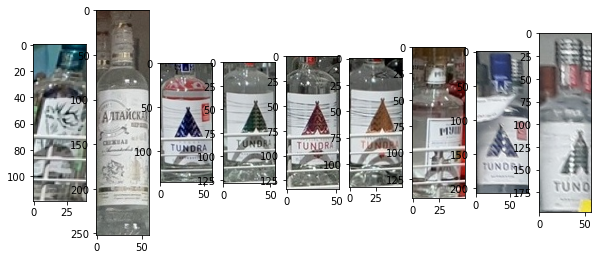

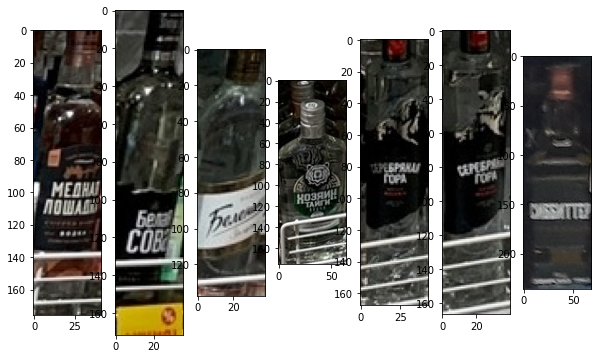

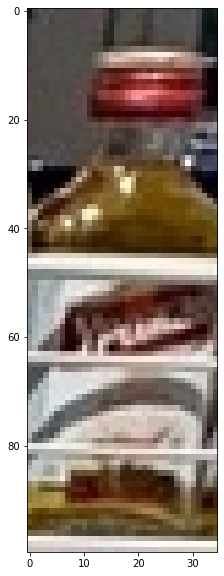

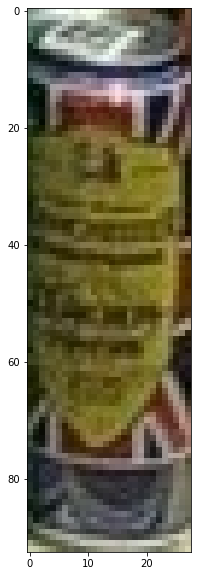

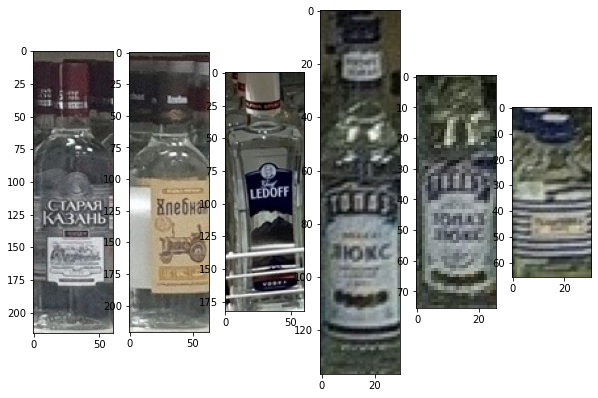

...

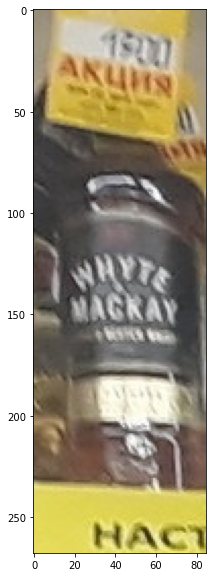

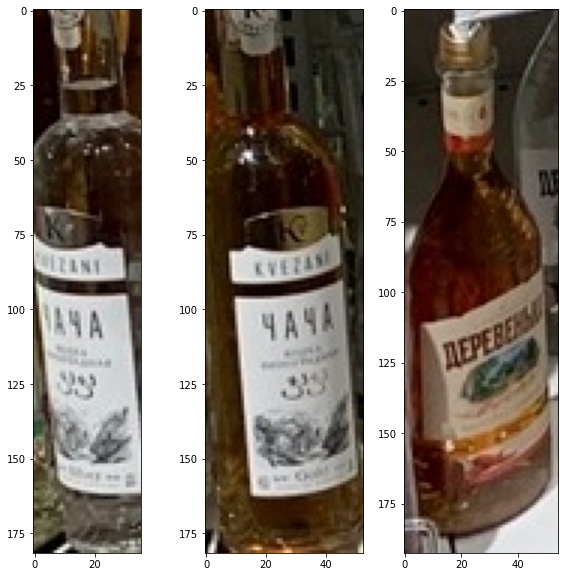

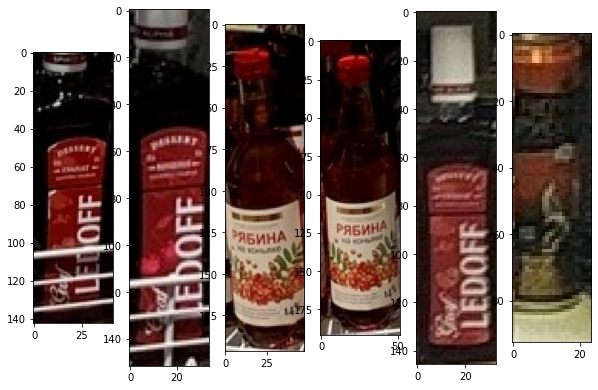

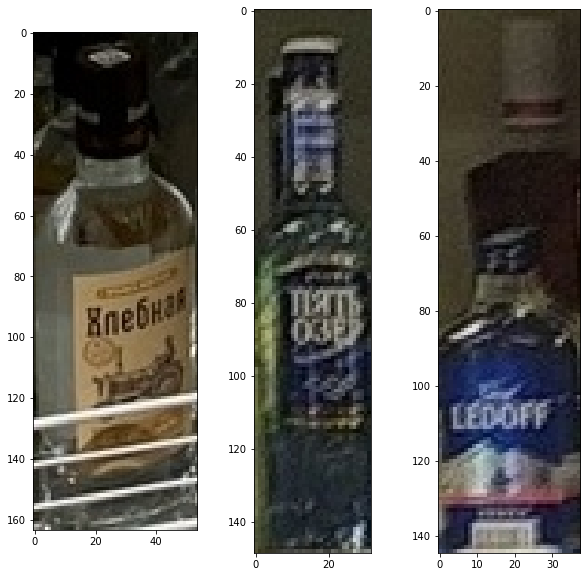

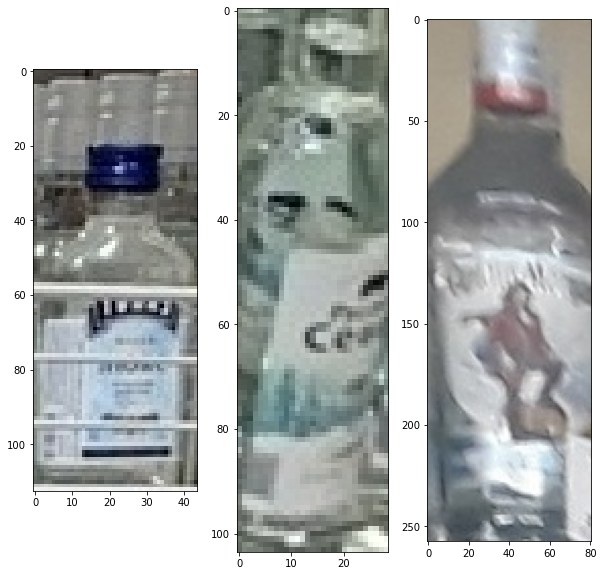

In [12]:
for label in set(labels):
    plt.figure(figsize=(10, 10))
    for i in range(len(images[labels==label])):
        plt.subplot(1, len(images[labels==label]), i+1)
        plt.imshow(images[labels==label][i])